# Model Training and Evaluation

## This Notebook describes and implements the following steps:

### I Implementing Training and Evaluation Code in `model_train.py`
     - Loss and Optimiser to use
     - Data Loaders and Transformations
     - Metrics for Evaluation
     - Enable GPU Training
 
### II  Deciding First Model & Parameters to Train 
### III Refinement: Hyperparameters Search
### IV Refinement: Training Model with Best Hyperparameters
### V Generating Profiler Report
### VI Model Evaluation on Metrics
### VII Deploying Endpoint
### VIII Inference for each Class

---------


## Step I: Implementing Training and Evaluation Code in `model_train.py`

### Loss and Optimiser

- We use **Cross Entropy Loss with the Adam Optimiser**

### Data Loaders & Transformations

- As we discussed in `Create_Data_Capstone.ipynb`, we will load the data from S3 Bucket and apply the following transformations:
    - Resize Image to 224 x 224
    - Apply Random Horizontal Flips
    - Convert to Tensor
    
### Metrics

- I have coded Precision, Recall and F1 Score for Multi-Class Classification, as told in `Capstone Proposal`
- The metrics are coded in the Test Loop and we Log them to check during Model Training
- Other than the Class Wise Metrics, we also see the overall Accuracy on the Test Data

### GPU Training

- The Training and Testing code is compatible with GPU Training

### Check `model_train.py` to check the above implementations
--------

## Step II: Deciding First Model & Parameters to Train

### To begin, we try fine tuning a Pre-Trained Resnet50 Model, as defined in `model_train.py` on our Data
### From intuition we try the following Hyper Parameters:
- Batch Size: 64
- Learning Rate: 0.005
- Number of Epochs: 5

In [1]:
hyperparameters = {"batch_size": 64, \
                   "learning_rate": "0.005"}
hyperparameters

{'batch_size': 64, 'learning_rate': '0.005'}

In [ ]:
role = sagemaker.get_execution_role()

estimator = PyTorch(
    entry_point='model_train.py',
    base_job_name='initial-bins',
    role=role,
    instance_count=1,
    instance_type="ml.p3.2xlarge",
    framework_version='1.4.0',
    py_version='py3',
    hyperparameters=hyperparameters,
)

In [ ]:
os.environ['SM_CHANNEL_TRAINING']='s3://sagemaker-studio-0qajs6acpsz/BinDataset/'
os.environ['SM_MODEL_DIR']='s3://sagemaker-studio-0qajs6acpsz/model/'
os.environ['SM_OUTPUT_DATA_DIR']='s3://sagemaker-studio-0qajs6acpsz/output/'
estimator.fit({"training": "s3://sagemaker-studio-0qajs6acpsz/BinDataset/"}, wait=False)

### Results 

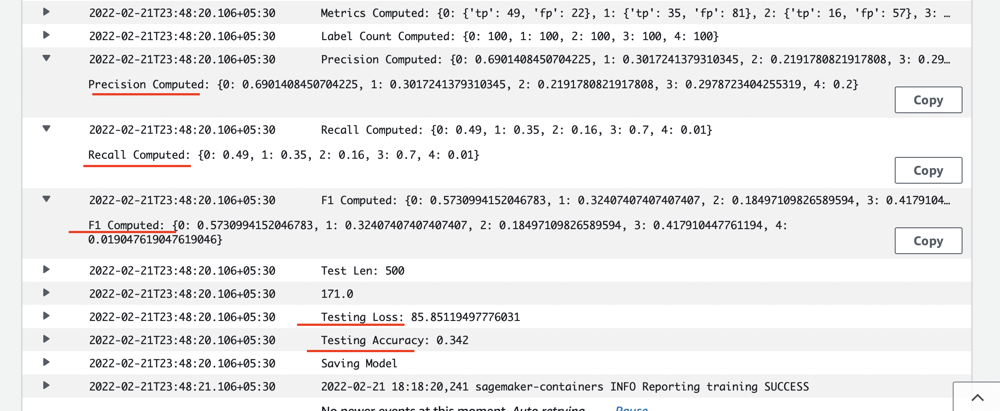

### Class Wise Metrics

| **Class** | **Precision** | **Recall** | **F1 Score** |
|-----------|---------------|------------|--------------|
| **1**     | 0.690         | 0.49       | 0.573        |
| **2**     | 0.301         | 0.35       | 0.324        |
| **3**     | 0.219         | 0.16       | 0.184        |
| **4**     | 0.297         | 0.7        | 0.417        |
| **5**     | 0.2           | 0.01       | 0.019        |

#### Overall Test Set Accuracy = 0.342 (34.2%)

### We see that our first Model comes close to the Benchmark, but the overall Test Accuracy falls short ~ 1.2%

### So let's try to refine this Model with searching for better Hyper Params

## Step III: Refinement: Hyperparameters Search

In [1]:
%%capture
!pip install smdebug torch torchvision tqdm

In [2]:
import sagemaker
import boto3
from sagemaker.tuner import CategoricalParameter, ContinuousParameter, HyperparameterTuner
from sagemaker.pytorch import PyTorch
from sagemaker import get_execution_role
from sagemaker.debugger import Rule, DebuggerHookConfig, TensorBoardOutputConfig, CollectionConfig, ProfilerRule, rule_configs
from sagemaker.debugger import ProfilerConfig, FrameworkProfile
from smdebug.trials import create_trial
from smdebug.core.modes import ModeKeys
from smdebug.profiler.analysis.notebook_utils.training_job import TrainingJob
from smdebug.profiler.analysis.notebook_utils.timeline_charts import TimelineCharts
from smdebug import modes
import matplotlib as mpl
import matplotlib.pyplot as plt
import os
import IPython

[2022-02-21 08:20:48.581 ip-172-16-132-160:26471 INFO utils.py:27] RULE_JOB_STOP_SIGNAL_FILENAME: None


In [3]:
hyperparameter_ranges = {
    "learning_rate": ContinuousParameter(0.001, 0.1),
    "batch_size": CategoricalParameter([16, 32, 64, 128, 256]),
}

role = sagemaker.get_execution_role()

objective_metric_name = "Valid Loss"
objective_type = "Minimize"
metric_definitions = [{"Name": "Valid Loss", "Regex": "Final Validation Loss: ([0-9\\.]+)"}]

In [6]:
estimator = PyTorch(
    entry_point="model_train.py",
    base_job_name='test_bins',
    role=role,
    framework_version="1.4.0",
    instance_count=1,
    instance_type="ml.p3.2xlarge",
    py_version='py3'
)

tuner = HyperparameterTuner(
    estimator,
    objective_metric_name,
    hyperparameter_ranges,
    metric_definitions,
    max_jobs=4,
    max_parallel_jobs=2,
    objective_type=objective_type
)

In [7]:
os.environ['SM_CHANNEL_TRAINING']='s3://sagemaker-studio-0qajs6acpsz/BinDataset/'
os.environ['SM_MODEL_DIR']='s3://sagemaker-studio-0qajs6acpsz/model/'
os.environ['SM_OUTPUT_DATA_DIR']='s3://sagemaker-studio-0qajs6acpsz/output/'
tuner.fit({"training": "s3://sagemaker-studio-0qajs6acpsz/BinDataset/"})

..............................................................................................................................................................................................................................................................................................................................................................................................!


In [8]:
from sagemaker.analytics import HyperparameterTuningJobAnalytics

exp = HyperparameterTuningJobAnalytics(
  hyperparameter_tuning_job_name='pytorch-training-220221-0835')

jobs = exp.dataframe()

jobs.sort_values('FinalObjectiveValue', ascending=0)

,batch_size,learning_rate,TrainingJobName,TrainingJobStatus,FinalObjectiveValue,TrainingStartTime,TrainingEndTime,TrainingElapsedTimeSeconds
3,"""128""",0.059663,pytorch-training-220221-0835-001-61ba29e9,Completed,196.0,2022-02-21 08:38:19+00:00,2022-02-21 08:49:44+00:00,685.0
2,"""64""",0.007783,pytorch-training-220221-0835-002-a00a4de7,Completed,88.0,2022-02-21 08:37:21+00:00,2022-02-21 08:49:45+00:00,744.0
0,"""64""",0.001545,pytorch-training-220221-0835-004-7dba57e9,Completed,87.0,2022-02-21 08:51:59+00:00,2022-02-21 09:04:24+00:00,745.0
1,"""32""",0.001948,pytorch-training-220221-0835-003-c9d3e5a8,Completed,44.0,2022-02-21 08:54:34+00:00,2022-02-21 09:06:05+00:00,691.0


In [9]:
best_estimator=tuner.best_estimator()


2022-02-21 09:06:05 Starting - Preparing the instances for training
2022-02-21 09:06:05 Downloading - Downloading input data
2022-02-21 09:06:05 Training - Training image download completed. Training in progress.
2022-02-21 09:06:05 Uploading - Uploading generated training model
2022-02-21 09:06:05 Completed - Training job completed


In [10]:
best_estimator.hyperparameters()

{'_tuning_objective_metric': '"Valid Loss"',
 'batch_size': '"32"',
 'learning_rate': '0.0019480490819629365',
 'sagemaker_container_log_level': '20',
 'sagemaker_estimator_class_name': '"PyTorch"',
 'sagemaker_estimator_module': '"sagemaker.pytorch.estimator"',
 'sagemaker_job_name': '"test_bins-2022-02-21-08-35-21-688"',
 'sagemaker_program': '"model_train.py"',
 'sagemaker_region': '"us-east-1"',
 'sagemaker_submit_directory': '"s3://sagemaker-us-east-1-165277402482/test_bins-2022-02-21-08-35-21-688/source/sourcedir.tar.gz"'}

### Let's perform Training for the best HP we found: Batch Size = 32 and Learning Rate = 0.002

In [21]:
hyperparameters = {"batch_size": int(best_estimator.hyperparameters()['batch_size'].replace('"', '')), \
                   "learning_rate": str(round(float(best_estimator.hyperparameters()['learning_rate']), 3))}
hyperparameters

{'batch_size': 32, 'learning_rate': '0.002'}

In [19]:
rules = [
    Rule.sagemaker(rule_configs.loss_not_decreasing()),
    Rule.sagemaker(rule_configs.vanishing_gradient()),
    ProfilerRule.sagemaker(rule_configs.LowGPUUtilization()),
    Rule.sagemaker(rule_configs.overfit()),
    Rule.sagemaker(rule_configs.overtraining()),
    Rule.sagemaker(rule_configs.poor_weight_initialization()),
    ProfilerRule.sagemaker(rule_configs.ProfilerReport()),
]

In [20]:
hook_config = DebuggerHookConfig(
    hook_parameters={
        "train.save_interval": "1",
        "eval.save_interval": "1"
    }
)

profiler_config = ProfilerConfig(
    system_monitor_interval_millis=500, framework_profile_params=FrameworkProfile(num_steps=10)
)

In [22]:
estimator = PyTorch(
    entry_point='model_train.py',
    base_job_name='final-bins',
    role=role,
    instance_count=1,
    instance_type="ml.p3.2xlarge",
    framework_version='1.4.0',
    py_version='py3',
    hyperparameters=hyperparameters,
    # Params for Debugger and Profiler
    rules = rules,
    debugger_hook_config=hook_config,
    profiler_config=profiler_config,
)

In [23]:
os.environ['SM_CHANNEL_TRAINING']='s3://sagemaker-studio-0qajs6acpsz/BinDataset/'
os.environ['SM_MODEL_DIR']='s3://sagemaker-studio-0qajs6acpsz/model/'
os.environ['SM_OUTPUT_DATA_DIR']='s3://sagemaker-studio-0qajs6acpsz/output/'
estimator.fit({"training": "s3://sagemaker-studio-0qajs6acpsz/BinDataset/"}, wait=False)

Training jobname: final-bins-2022-02-21-09-54-56-642
Region: us-east-1
[2022-02-21 10:24:12.819 ip-172-16-132-160:26471 INFO s3_trial.py:42] Loading trial debug-output at path s3://sagemaker-us-east-1-165277402482/final-bins-2022-02-21-09-54-56-642/debug-output
[2022-02-21 10:24:13.635 ip-172-16-132-160:26471 INFO trial.py:198] Training has ended, will refresh one final time in 1 sec.
[2022-02-21 10:24:14.681 ip-172-16-132-160:26471 INFO trial.py:210] Loaded all steps
['CrossEntropyLoss_output_0', 'gradient/ResNet_fc.0.bias', 'gradient/ResNet_fc.0.weight', 'gradient/ResNet_fc.2.bias', 'gradient/ResNet_fc.2.weight', 'layer1.0.relu_input_0', 'layer1.0.relu_input_1', 'layer1.0.relu_input_2', 'layer1.1.relu_input_0', 'layer1.1.relu_input_1', 'layer1.1.relu_input_2', 'layer1.2.relu_input_0', 'layer1.2.relu_input_1', 'layer1.2.relu_input_2', 'layer2.0.relu_input_0', 'layer2.0.relu_input_1', 'layer2.0.relu_input_2', 'layer2.1.relu_input_0', 'layer2.1.relu_input_1', 'layer2.1.relu_input_2', 'l

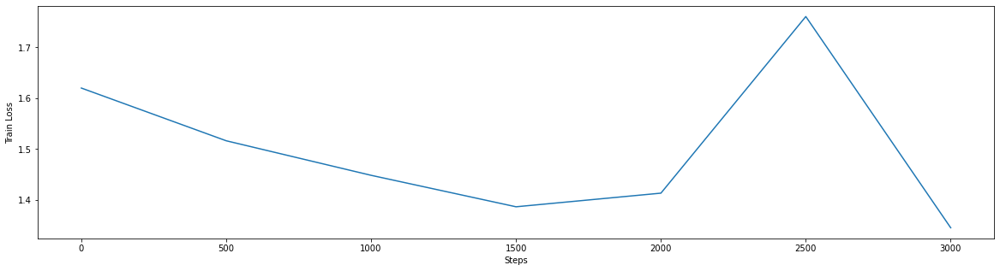

In [24]:
session = boto3.session.Session()
region = session.region_name

training_job_name = estimator.latest_training_job.name
print(f"Training jobname: {training_job_name}")
print(f"Region: {region}")

trial = create_trial(estimator.latest_job_debugger_artifacts_path())

print(trial.tensor_names())
print(len(trial.tensor("CrossEntropyLoss_output_0").steps(mode=ModeKeys.TRAIN)))
print(len(trial.tensor("CrossEntropyLoss_output_0").steps(mode=ModeKeys.EVAL)))

mpl.rcParams['figure.figsize'] = 20, 5

plt.ylabel('Train Loss')
plt.xlabel('Steps')
plt.plot(trial.steps(mode=modes.TRAIN),
         list(trial.tensor('CrossEntropyLoss_output_0').values(mode=modes.TRAIN).values()))
plt.show()

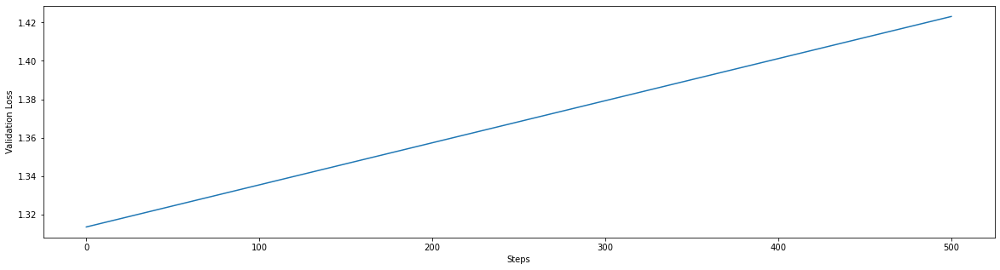

In [28]:
plt.ylabel('Validation Loss')
plt.xlabel('Steps')
plt.plot(trial.steps(mode=modes.EVAL),
         list(trial.tensor('CrossEntropyLoss_output_0').values(mode=modes.EVAL).values()))
plt.show()

In [30]:
list(trial.tensor('CrossEntropyLoss_output_0').values(mode=modes.EVAL).values())

[array(1.3136324, dtype=float32), array(1.4230787, dtype=float32)]

In [31]:
trial.steps(mode=modes.EVAL)

[0, 500]

In [32]:
list(trial.tensor('CrossEntropyLoss_output_0').values(mode=modes.TRAIN).values())

[array(1.6200974, dtype=float32),
 array(1.516396, dtype=float32),
 array(1.4484699, dtype=float32),
 array(1.386592, dtype=float32),
 array(1.4133886, dtype=float32),
 array(1.7607183, dtype=float32),
 array(1.3452758, dtype=float32)]

In [33]:
trial.steps(mode=modes.TRAIN)

[0, 500, 1000, 1500, 2000, 2500, 3000]

In [34]:
session = boto3.session.Session()
region = session.region_name

training_job_name = estimator.latest_training_job.name
print(f"Training jobname: {training_job_name}")
print(f"Region: {region}")

trial = create_trial(estimator.latest_job_debugger_artifacts_path())


tj = TrainingJob(training_job_name, region)
tj.wait_for_sys_profiling_data_to_be_available()

system_metrics_reader = tj.get_systems_metrics_reader()
system_metrics_reader.refresh_event_file_list()

view_timeline_charts = TimelineCharts(
    system_metrics_reader,
    framework_metrics_reader=None,
    select_dimensions=["CPU", "GPU"],
    select_events=["total"],
)

rule_output_path = estimator.output_path + estimator.latest_training_job.job_name + "/rule-output"
print(f"You will find the profiler report in {rule_output_path}")

! aws s3 ls {rule_output_path} --recursive
! aws s3 cp {rule_output_path} ./ --recursive

# get the autogenerated folder name of profiler report
profiler_report_name = [
    rule["RuleConfigurationName"]
    for rule in estimator.latest_training_job.rule_job_summary()
    if "Profiler" in rule["RuleConfigurationName"]
][0]

IPython.display.HTML(filename=profiler_report_name + "/profiler-output/profiler-report.html")



Training jobname: final-bins-2022-02-21-09-54-56-642
Region: us-east-1
[2022-02-21 10:31:59.463 ip-172-16-132-160:26471 INFO s3_trial.py:42] Loading trial debug-output at path s3://sagemaker-us-east-1-165277402482/final-bins-2022-02-21-09-54-56-642/debug-output
ProfilerConfig:{'S3OutputPath': 's3://sagemaker-us-east-1-165277402482/', 'ProfilingIntervalInMilliseconds': 500, 'ProfilingParameters': {'DataloaderProfilingConfig': '{"StartStep": 0, "NumSteps": 10, "MetricsRegex": ".*", }', 'DetailedProfilingConfig': '{"StartStep": 0, "NumSteps": 10, }', 'FileOpenFailThreshold': '50', 'HorovodProfilingConfig': '{"StartStep": 0, "NumSteps": 10, }', 'LocalPath': '/opt/ml/output/profiler', 'PythonProfilingConfig': '{"StartStep": 0, "NumSteps": 10, "ProfilerName": "cprofile", "cProfileTimer": "total_time", }', 'RotateFileCloseIntervalInSeconds': '60', 'RotateMaxFileSizeInBytes': '10485760', 'SMDataParallelProfilingConfig': '{"StartStep": 0, "NumSteps": 10, }'}}
s3 path:s3://sagemaker-us-east-1-16

You will find the profiler report in s3://sagemaker-us-east-1-165277402482/final-bins-2022-02-21-09-54-56-642/rule-output
2022-02-21 10:18:59     370458 final-bins-2022-02-21-09-54-56-642/rule-output/ProfilerReport/profiler-output/profiler-report.html
2022-02-21 10:18:58     219242 final-bins-2022-02-21-09-54-56-642/rule-output/ProfilerReport/profiler-output/profiler-report.ipynb
2022-02-21 10:18:55        551 final-bins-2022-02-21-09-54-56-642/rule-output/ProfilerReport/profiler-output/profiler-reports/BatchSize.json
2022-02-21 10:18:54      26867 final-bins-2022-02-21-09-54-56-642/rule-output/ProfilerReport/profiler-output/profiler-reports/CPUBottleneck.json
2022-02-21 10:18:54        126 final-bins-2022-02-21-09-54-56-642/rule-output/ProfilerReport/profiler-output/profiler-reports/Dataloader.json
2022-02-21 10:18:54        130 final-bins-2022-02-21-09-54-56-642/rule-output/ProfilerReport/profiler-output/profiler-reports/GPUMemoryIncrease.json
2022-02-21 10:18:54       5232 final-bin

In [35]:
import shutil

In [36]:
shutil.make_archive("Profiler_Report", "zip", "ProfilerReport")

'/home/ec2-user/SageMaker/Profiler_Report.zip'

### Model Deployment and Inference

In [55]:
from sagemaker.pytorch import PyTorchModel
from sagemaker.predictor import Predictor
import numpy as np

In [38]:
model_location=estimator.model_data


In [39]:
jpeg_serializer = sagemaker.serializers.IdentitySerializer("image/jpeg")
json_deserializer = sagemaker.deserializers.JSONDeserializer()


class ImagePredictor(Predictor):
    def __init__(self, endpoint_name, sagemaker_session):
        super(ImagePredictor, self).__init__(
            endpoint_name,
            sagemaker_session=sagemaker_session,
            serializer=jpeg_serializer,
            deserializer=json_deserializer,
        )

In [51]:
# We make use of an inference script, for creating a Pytorch Model from the trained model above, 
# which we can query with the endpoint with inputs
pytorch_model = PyTorchModel(model_data=model_location, role=role, entry_point='inference.py',py_version='py3',
                             framework_version='1.4',
                             predictor_cls=ImagePredictor)

In [52]:
#Creating Endpoint with the specified Instance Type and Count
predictor = pytorch_model.deploy(initial_instance_count=1, instance_type='ml.t2.medium')


-------------!

### Got new data for inferencing from my Get More Data Script

In [47]:
Inference_Images = {1: ['200000.jpg','200017.jpg','200036.jpg','200072.jpg','200102.jpg','200112.jpg','200119.jpg',
  '200124.jpg','200128.jpg','200145.jpg'],
 2: ['200012.jpg','200016.jpg','200021.jpg','200023.jpg','200024.jpg','200027.jpg','200035.jpg',
     '200040.jpg','200042.jpg','200053.jpg'],
 3: ['200008.jpg','200011.jpg','200015.jpg','200019.jpg','200022.jpg','200025.jpg','200030.jpg',
  '200033.jpg','200034.jpg','200039.jpg'],
 4: ['200026.jpg','200031.jpg','200032.jpg','200037.jpg','200044.jpg','200047.jpg','200048.jpg','200055.jpg',
     '200058.jpg','200061.jpg'],
 5: ['200001.jpg','200004.jpg','200005.jpg','200020.jpg','200038.jpg','200043.jpg','200045.jpg','200046.jpg',
  '200052.jpg','200054.jpg']}

In [48]:
Inference_Images[1]

['200000.jpg',
 '200017.jpg',
 '200036.jpg',
 '200072.jpg',
 '200102.jpg',
 '200112.jpg',
 '200119.jpg',
 '200124.jpg',
 '200128.jpg',
 '200145.jpg']

### Checking for Class 1 Images

In [57]:
from PIL import Image
import io
import requests

CLASS 1 IMAGES


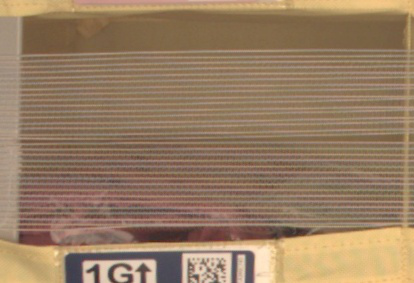

CLASS PREDICTED AS:  1


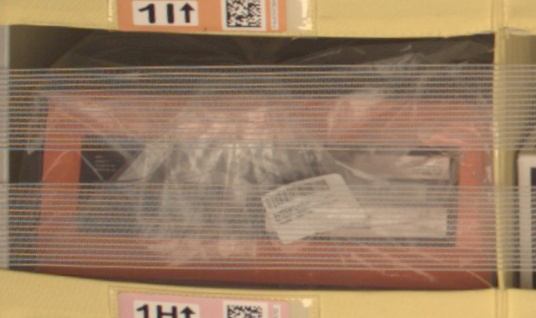

CLASS PREDICTED AS:  5


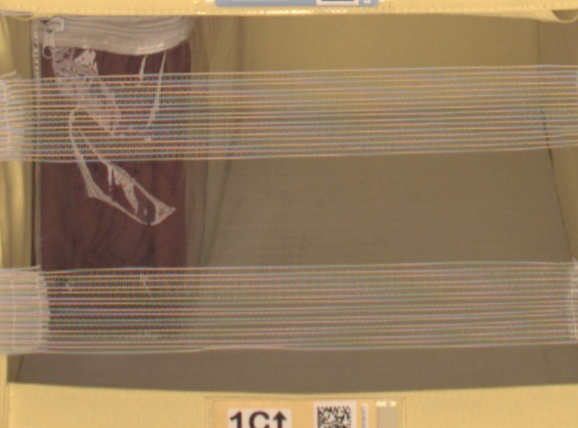

CLASS PREDICTED AS:  1


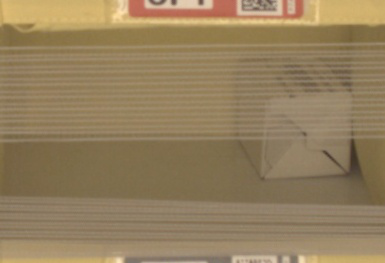

CLASS PREDICTED AS:  1


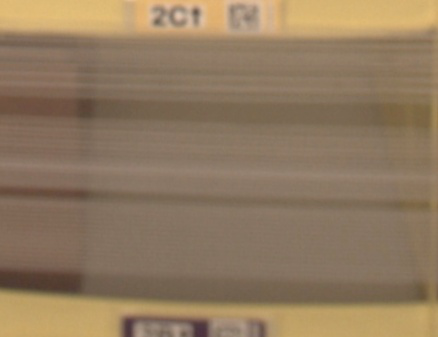

CLASS PREDICTED AS:  1


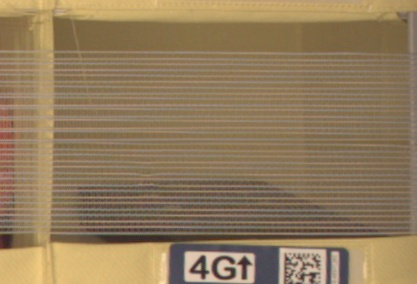

CLASS PREDICTED AS:  1


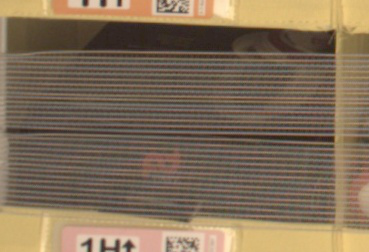

CLASS PREDICTED AS:  4


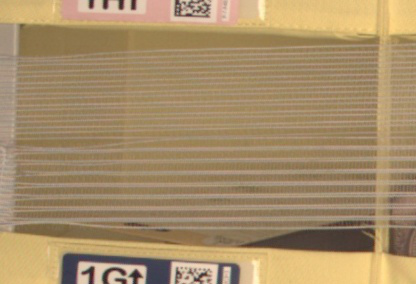

CLASS PREDICTED AS:  1


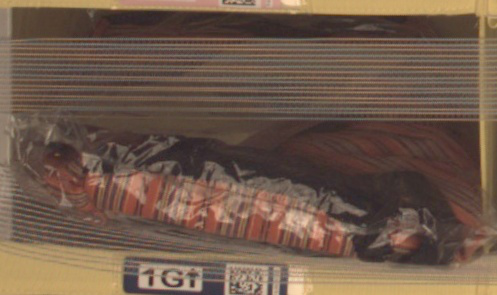

CLASS PREDICTED AS:  5


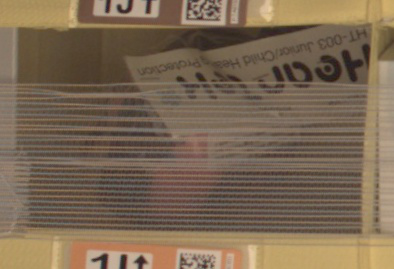

CLASS PREDICTED AS:  4


In [63]:

amazon_bin_data = "https://aft-vbi-pds.s3.amazonaws.com/bin-images/"
print("CLASS 1 IMAGES")
class_1_correct = 0
for i in range(10): #Since we have 10 Pictures for Inference
    request_dict={ "url": amazon_bin_data + Inference_Images[1][i]}
    img_bytes = requests.get(request_dict['url']).content
    display(Image.open(io.BytesIO(img_bytes))) #Display Inference Picture
    response=predictor.predict(img_bytes, initial_args={"ContentType": "image/jpeg"})
    class_predicted = np.argmax(response, 1)[0]
    print("CLASS PREDICTED AS: ",class_predicted + 1)
    if(class_predicted==0):
        class_1_correct+=1
    

In [64]:
print(f"Model got {class_1_correct}/10 Images right")

Model got 6/10 Images right


### Checking for Class 2 Images

CLASS 2 IMAGES


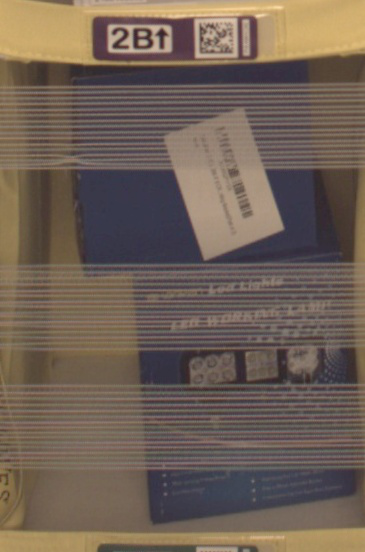

CLASS PREDICTED AS:  5


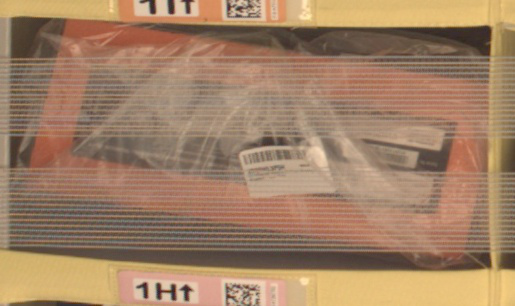

CLASS PREDICTED AS:  5


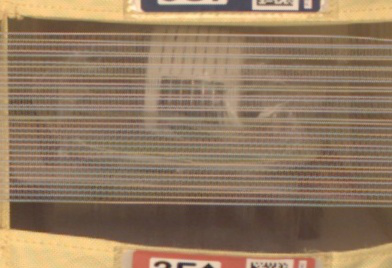

CLASS PREDICTED AS:  1


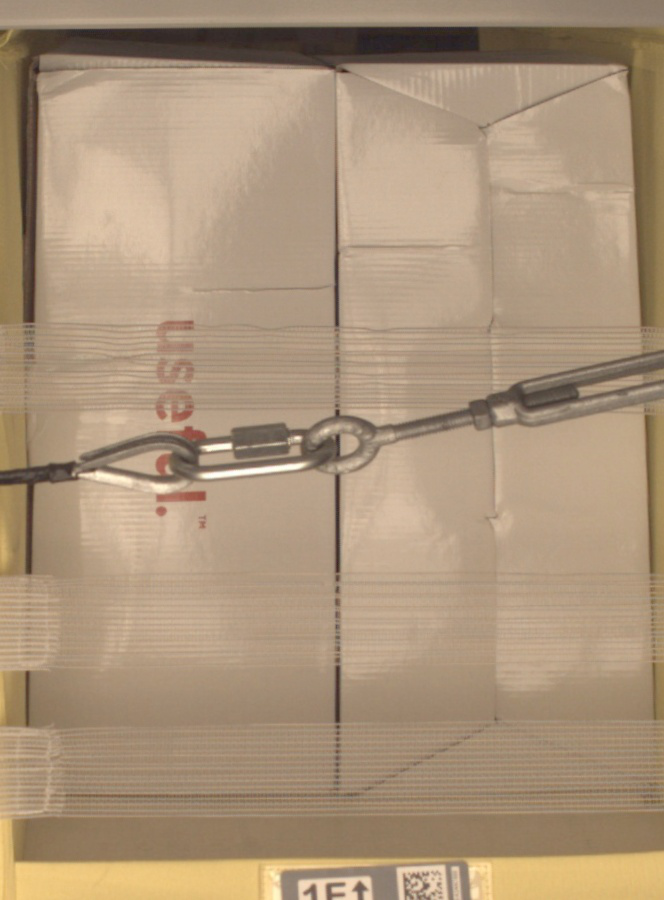

CLASS PREDICTED AS:  2


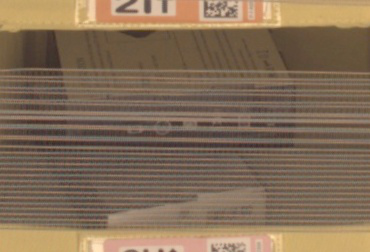

CLASS PREDICTED AS:  4


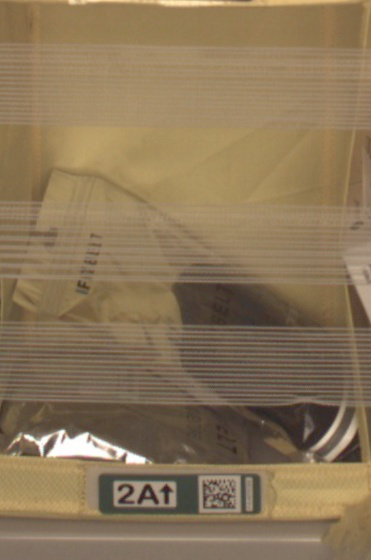

CLASS PREDICTED AS:  4


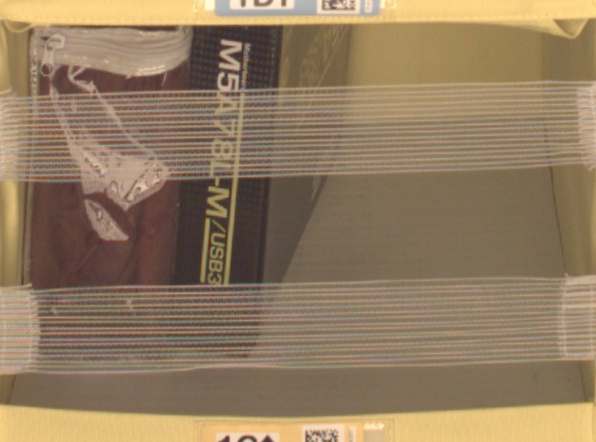

CLASS PREDICTED AS:  2


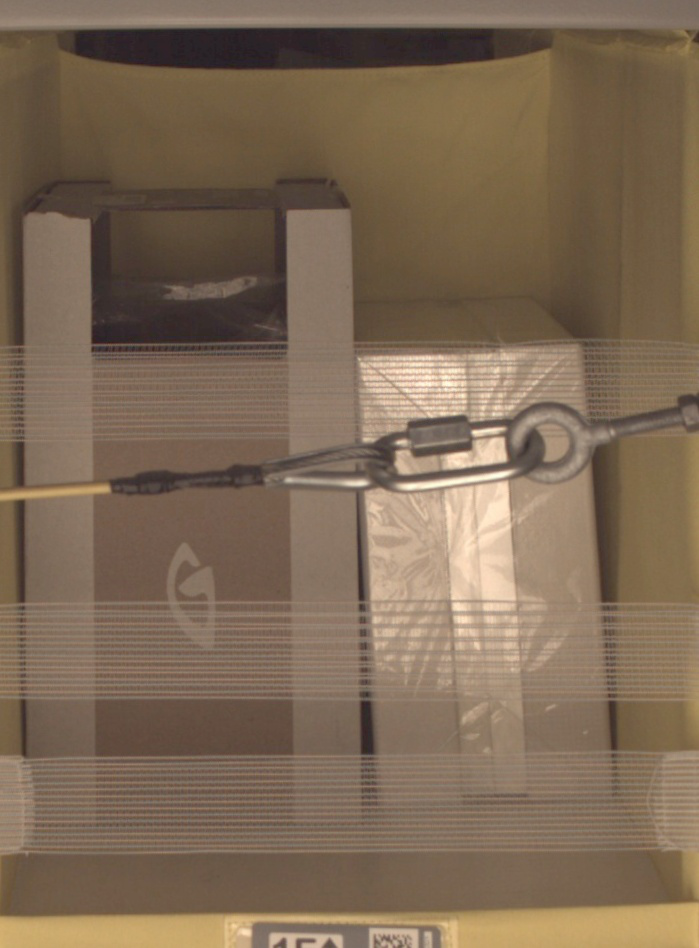

CLASS PREDICTED AS:  1


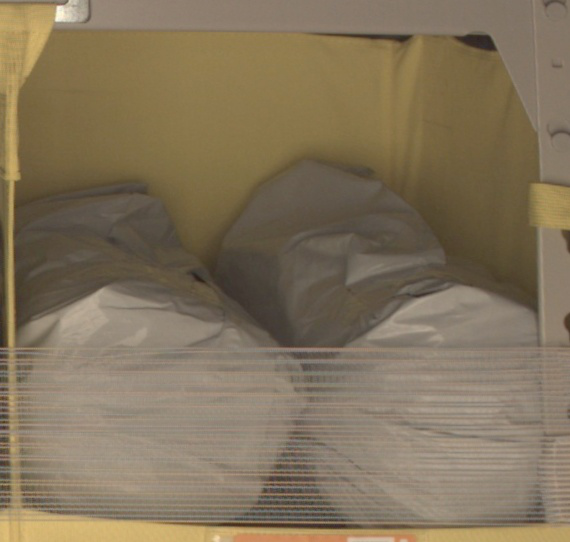

CLASS PREDICTED AS:  4


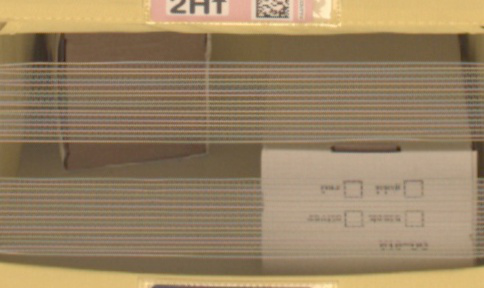

CLASS PREDICTED AS:  2


In [71]:

amazon_bin_data = "https://aft-vbi-pds.s3.amazonaws.com/bin-images/"
print("CLASS 2 IMAGES")
class_2_correct = 0
for i in range(10): #Since we have 10 Pictures for Inference
    request_dict={ "url": amazon_bin_data + Inference_Images[2][i]}
    img_bytes = requests.get(request_dict['url']).content
    display(Image.open(io.BytesIO(img_bytes))) #Display Inference Picture
    response=predictor.predict(img_bytes, initial_args={"ContentType": "image/jpeg"})
    class_predicted = np.argmax(response, 1)[0]
    print("CLASS PREDICTED AS: ",class_predicted + 1)
    if(class_predicted==1):
        class_2_correct+=1
    

In [72]:
print(f"Model got {class_2_correct}/10 Images right")

Model got 3/10 Images right


### Checking for Class 3 Images

CLASS 3 IMAGES


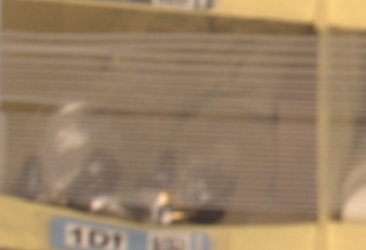

CLASS PREDICTED AS:  4


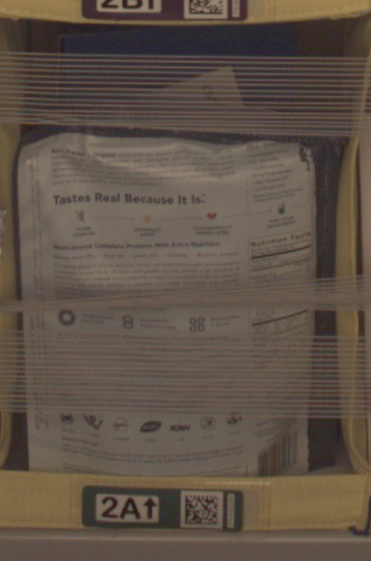

CLASS PREDICTED AS:  4


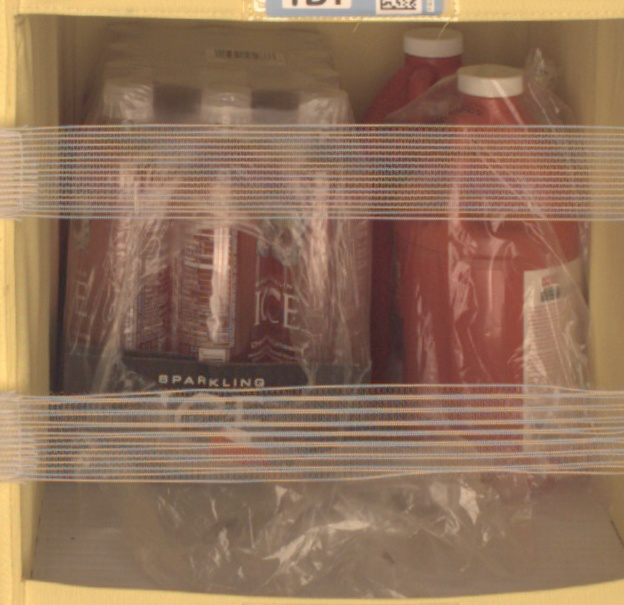

CLASS PREDICTED AS:  3


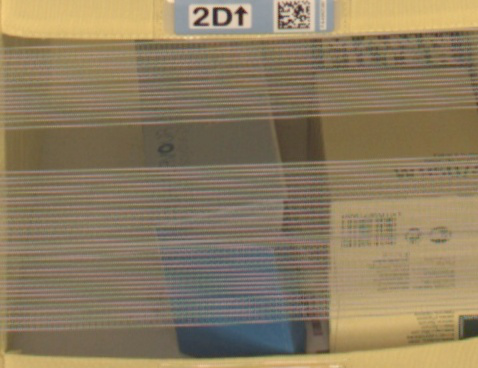

CLASS PREDICTED AS:  2


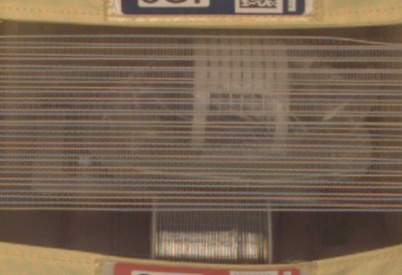

CLASS PREDICTED AS:  3


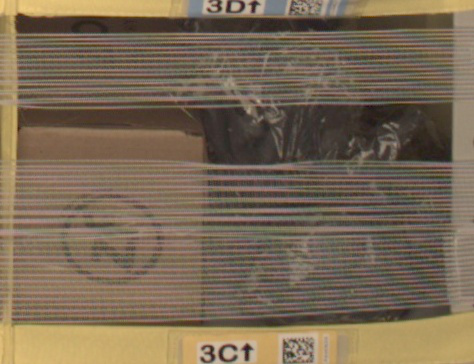

CLASS PREDICTED AS:  4


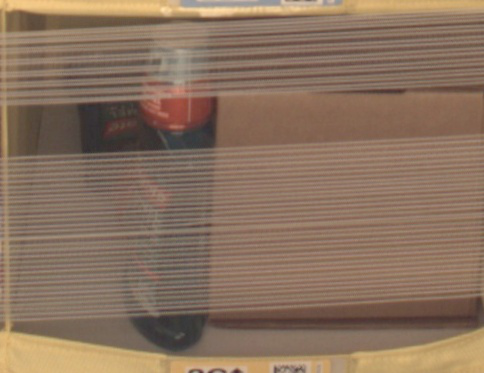

CLASS PREDICTED AS:  4


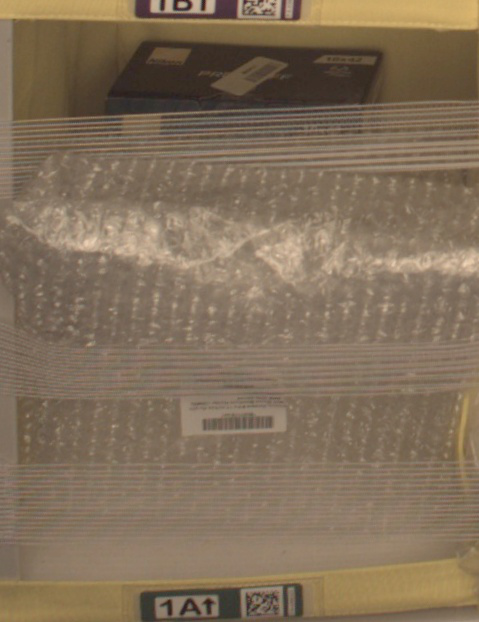

CLASS PREDICTED AS:  5


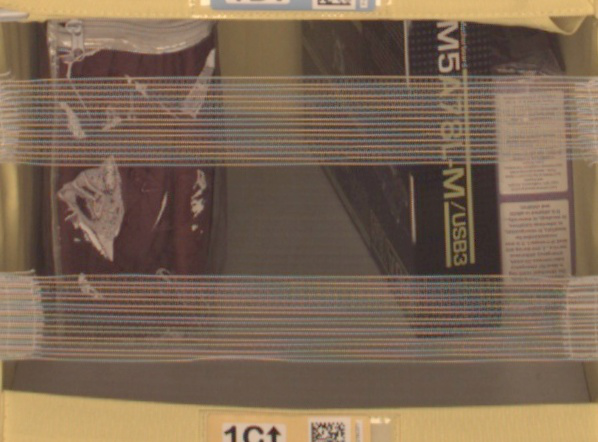

CLASS PREDICTED AS:  2


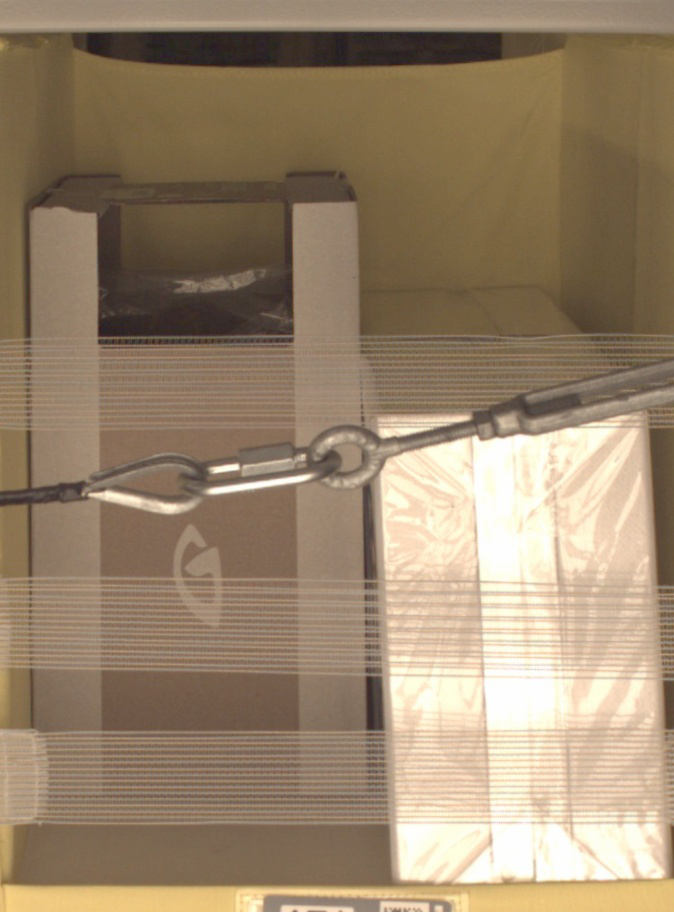

CLASS PREDICTED AS:  2


In [69]:

amazon_bin_data = "https://aft-vbi-pds.s3.amazonaws.com/bin-images/"
print("CLASS 3 IMAGES")
class_3_correct = 0
for i in range(10): #Since we have 10 Pictures for Inference
    request_dict={ "url": amazon_bin_data + Inference_Images[3][i]}
    img_bytes = requests.get(request_dict['url']).content
    display(Image.open(io.BytesIO(img_bytes))) #Display Inference Picture
    response=predictor.predict(img_bytes, initial_args={"ContentType": "image/jpeg"})
    class_predicted = np.argmax(response, 1)[0]
    print("CLASS PREDICTED AS: ",class_predicted + 1)
    if(class_predicted==2):
        class_3_correct+=1
    

In [70]:
print(f"Model got {class_3_correct}/10 Images right")

Model got 2/10 Images right


### Checking for Class 4 Images

CLASS 4 IMAGES


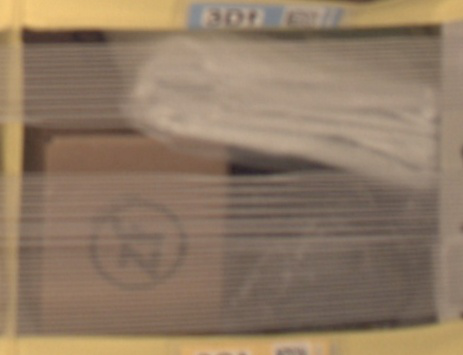

CLASS PREDICTED AS:  4


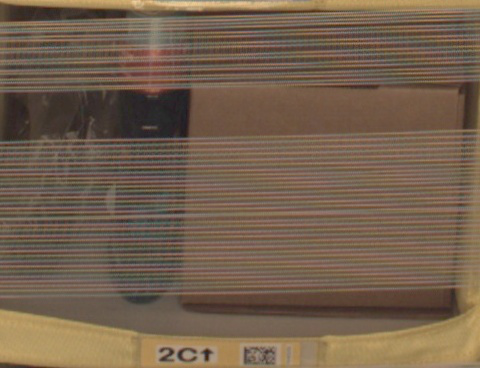

CLASS PREDICTED AS:  3


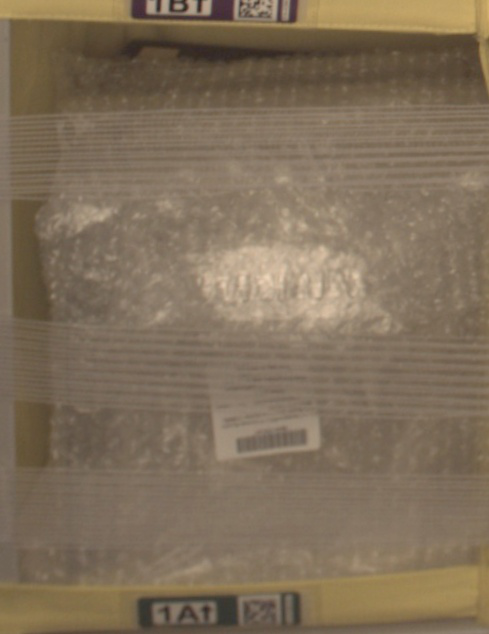

CLASS PREDICTED AS:  3


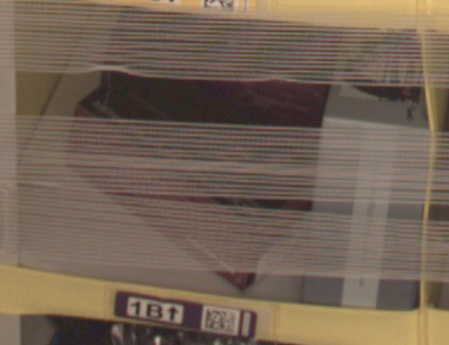

CLASS PREDICTED AS:  5


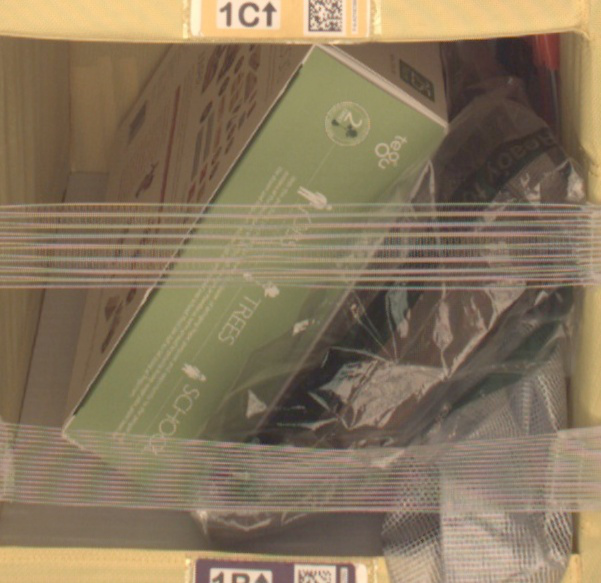

CLASS PREDICTED AS:  5


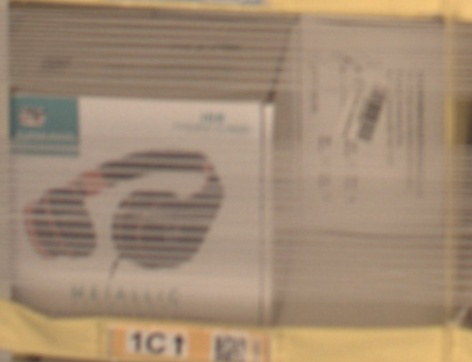

CLASS PREDICTED AS:  4


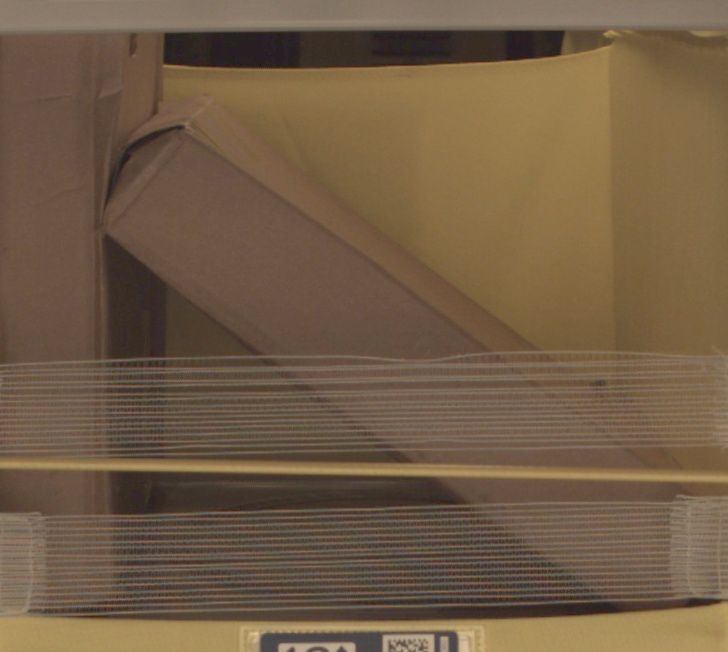

CLASS PREDICTED AS:  2


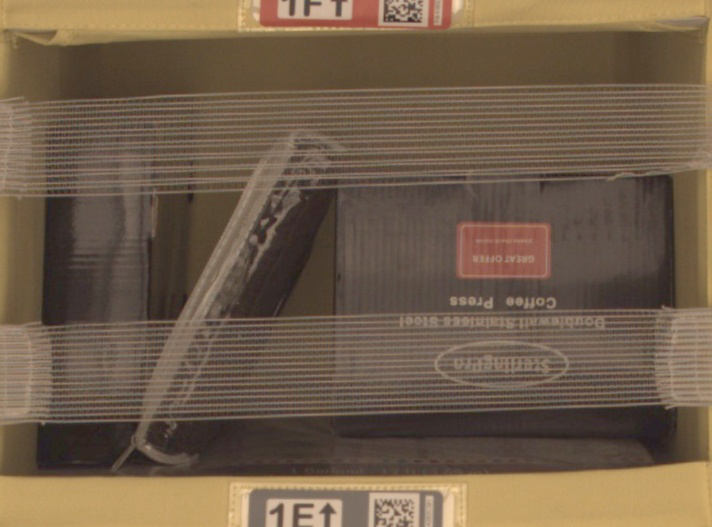

CLASS PREDICTED AS:  3


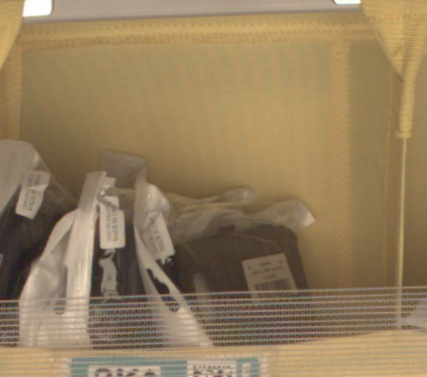

CLASS PREDICTED AS:  4


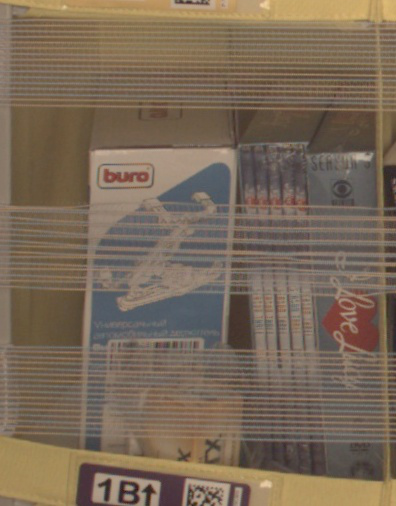

CLASS PREDICTED AS:  4


In [73]:

amazon_bin_data = "https://aft-vbi-pds.s3.amazonaws.com/bin-images/"
print("CLASS 4 IMAGES")
class_4_correct = 0
for i in range(10): #Since we have 10 Pictures for Inference
    request_dict={ "url": amazon_bin_data + Inference_Images[4][i]}
    img_bytes = requests.get(request_dict['url']).content
    display(Image.open(io.BytesIO(img_bytes))) #Display Inference Picture
    response=predictor.predict(img_bytes, initial_args={"ContentType": "image/jpeg"})
    class_predicted = np.argmax(response, 1)[0]
    print("CLASS PREDICTED AS: ",class_predicted + 1)
    if(class_predicted==3):
        class_4_correct+=1
    

In [74]:
print(f"Model got {class_4_correct}/10 Images right")

Model got 4/10 Images right


### Checking for Class 5 Images

CLASS 5 IMAGES


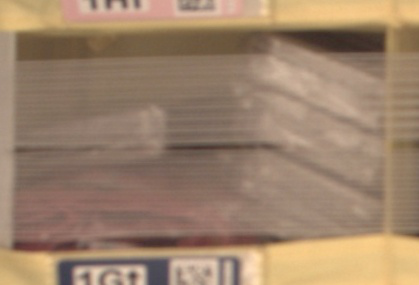

CLASS PREDICTED AS:  4


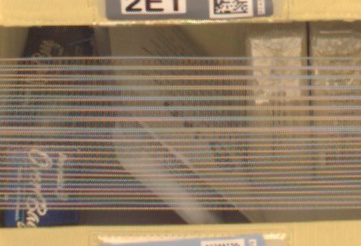

CLASS PREDICTED AS:  5


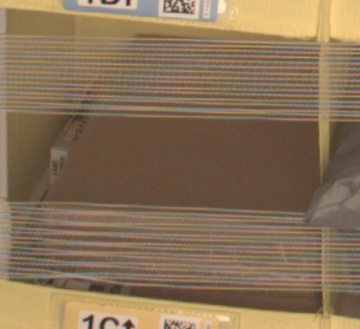

CLASS PREDICTED AS:  1


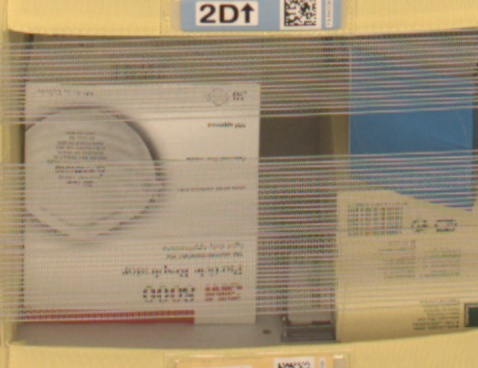

CLASS PREDICTED AS:  4


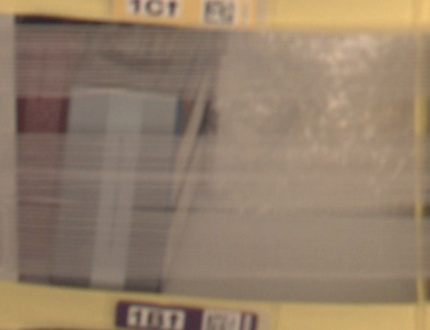

CLASS PREDICTED AS:  2


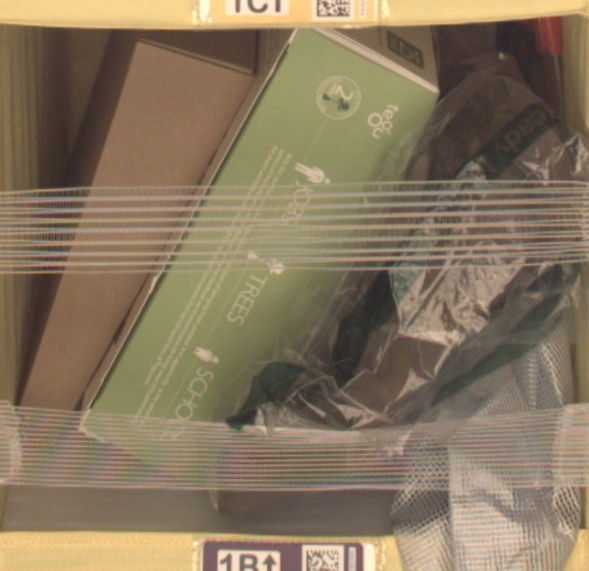

CLASS PREDICTED AS:  5


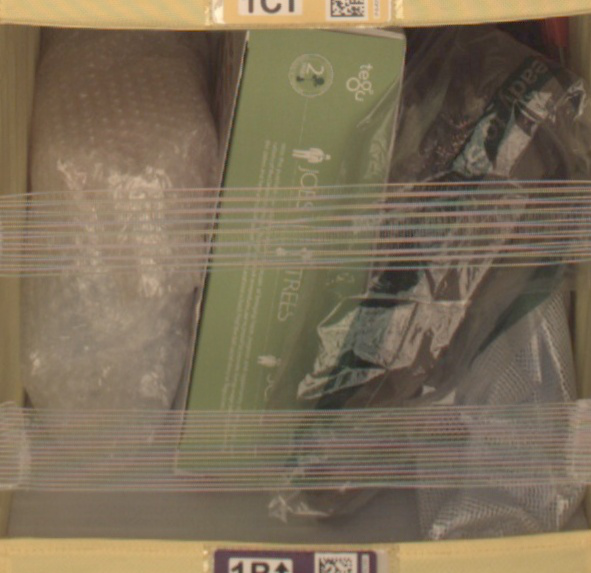

CLASS PREDICTED AS:  5


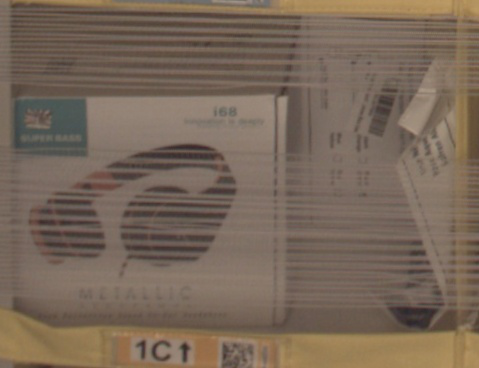

CLASS PREDICTED AS:  5


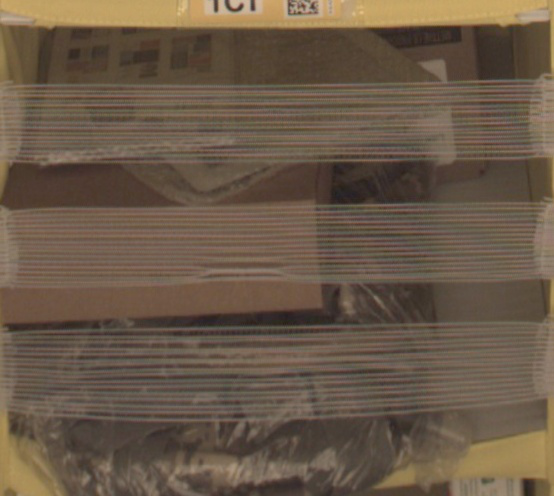

CLASS PREDICTED AS:  5


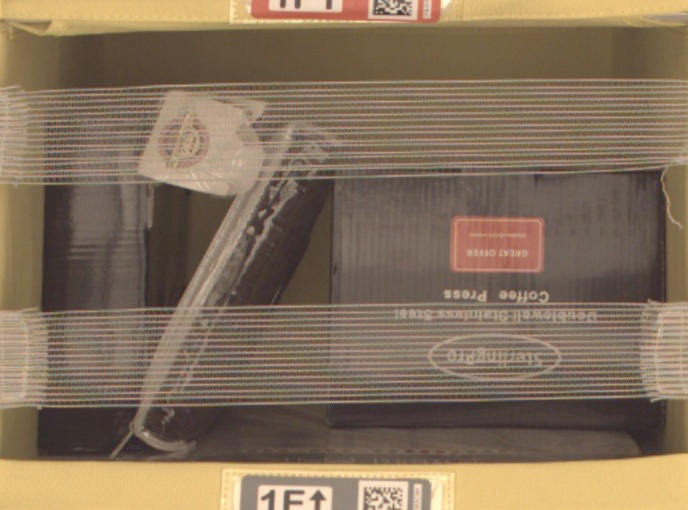

CLASS PREDICTED AS:  4


In [75]:

amazon_bin_data = "https://aft-vbi-pds.s3.amazonaws.com/bin-images/"
print("CLASS 5 IMAGES")
class_5_correct = 0
for i in range(10): #Since we have 10 Pictures for Inference
    request_dict={ "url": amazon_bin_data + Inference_Images[5][i]}
    img_bytes = requests.get(request_dict['url']).content
    display(Image.open(io.BytesIO(img_bytes))) #Display Inference Picture
    response=predictor.predict(img_bytes, initial_args={"ContentType": "image/jpeg"})
    class_predicted = np.argmax(response, 1)[0]
    print("CLASS PREDICTED AS: ",class_predicted + 1)
    if(class_predicted==4):
        class_5_correct+=1
    

In [76]:
print(f"Model got {class_5_correct}/10 Images right")

Model got 5/10 Images right


In [77]:
predictor.delete_endpoint() #To Delete After finishing Inferencing